In [51]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from IPython.display import Image

import scikitplot as skplt
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv("creditcard.csv")

In [3]:
data.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.168375e-15,3.416908e-16,-1.379537e-15,2.074095e-15,9.604066e-16,1.487313e-15,-5.556467e-16,1.213481e-16,-2.406331e-15,...,1.654067e-16,-3.568593e-16,2.578648e-16,4.473266e-15,5.340915e-16,1.683437e-15,-3.660091e-16,-1.227390e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [4]:
data.groupby("Class")[["Time"]].count()

,Time
Class,
0,284315
1,492


In [5]:
15000 / 284807.000000

0.052667244835976644

## Relação entre as variáveis e a classificação

Como existem muitos dados um sample dos dados foi sorteado para essa vizualização, com cerca de 5% dos dados originais (15466), capturando todos os dados de fraude, e o restante um sample dos aprovados.



In [6]:
nrows = len(data)
total_sample_size = 15000

draw_df = data.groupby('Class', group_keys=False).apply(lambda x: x.sample(max(int((x.count()[0]/nrows)*total_sample_size), 492)))

Salva as imagens com o pairplot para não demorar muito em futuras execuções, apenas executar quando necessário

In [7]:
# fist_set_variables = sns.pairplot(draw_df.iloc[:, np.hstack(([-1], range(0,10)))], diag_kind='kde', hue='Class', palette=["blue", "red"], plot_kws={'alpha':0.3})
# second_set_variables = sns.pairplot(draw_df.iloc[:, np.hstack(([-1], range(11,20)))], diag_kind='kde', hue='Class', palette=["blue", "red"], plot_kws={'alpha':0.3})
# third_set_variables = sns.pairplot(draw_df.iloc[:, np.hstack(([-1], range(21,30)))], diag_kind='kde', hue='Class', palette=["blue", "red"], plot_kws={'alpha':0.3})


# fist_set_variables.savefig("images/fist_set_variables.png")
# second_set_variables.savefig("images/second_set_variables.png")
# third_set_variables.savefig("images/third_set_variables.png")

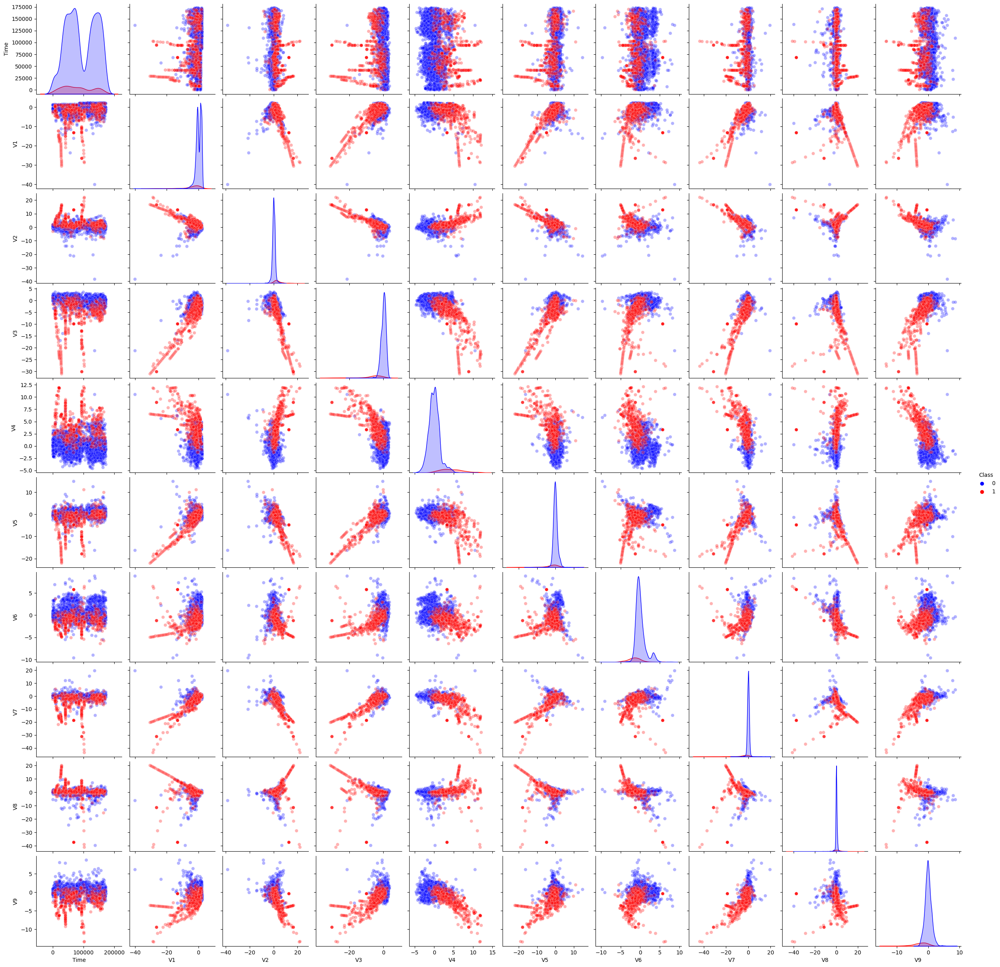

In [8]:
Image(filename="images/fist_set_variables.png")

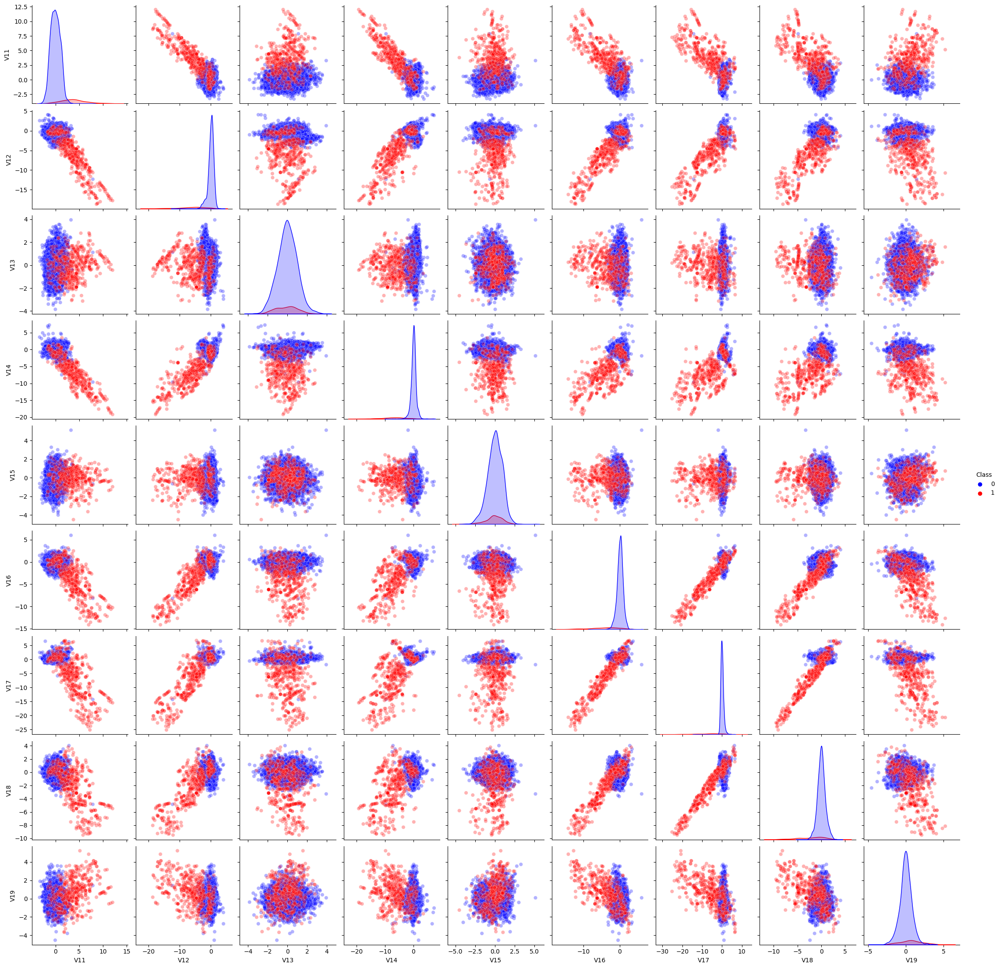

In [9]:
Image(filename="images/second_set_variables.png")

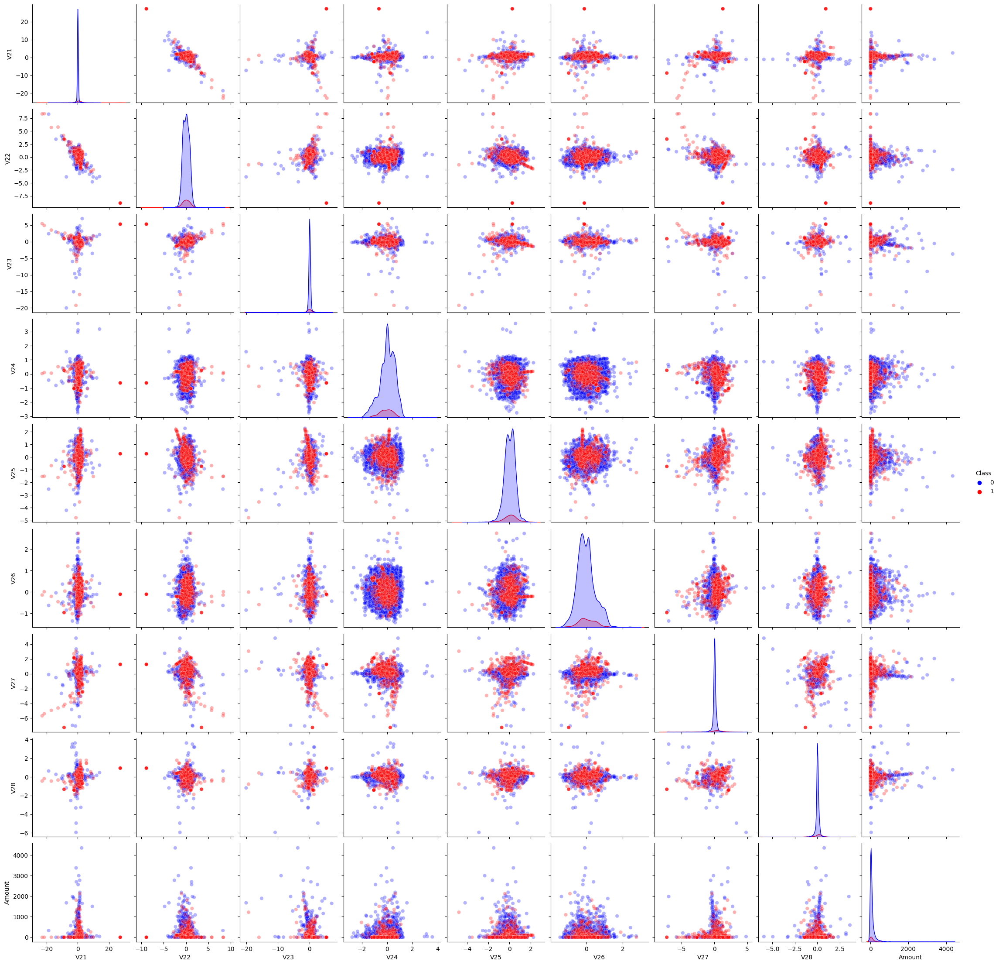

In [10]:
Image(filename="images/third_set_variables.png")

In [11]:
np.hstack(([-1], range(0,9)))

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8])

<Axes: >

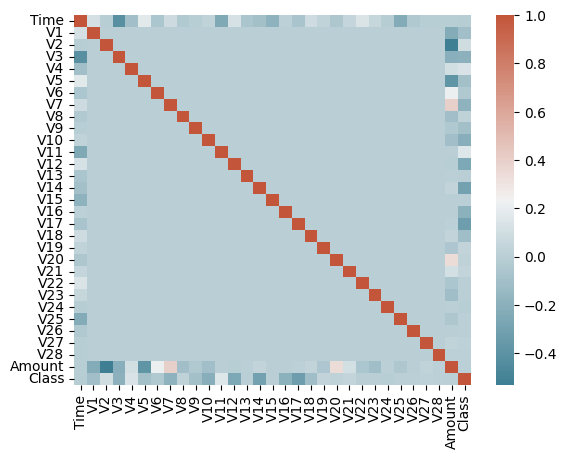

In [12]:
corr = data.corr()
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, cmap=sns.diverging_palette(220, 20, as_cmap=True))

### Variáveis mais relevantes

In [13]:
corr_df = corr.sort_values(by="Class")[["Class"]]

new_df = corr_df.head(5)
new_df = pd.concat([new_df, corr_df.tail(3)])

new_df

,Class
V17,-0.326481
V14,-0.302544
V12,-0.260593
V10,-0.216883
V16,-0.196539
V4,0.133447
V11,0.154876
Class,1.000000


### Pairplot com as variáveis de maior correlação, tempo e quantidade


In [14]:
# mvp_pairplot = sns.pairplot(draw_df[["V17", "V14", "V12", "V10", "V3", "V7", "V4", "V11", "Time", "Amount", "Class"]], diag_kind='kde', hue='Class', palette=["blue", "red"], plot_kws={'alpha':0.3})
# mvp_pairplot.savefig("images/mvp_pairplot.png")

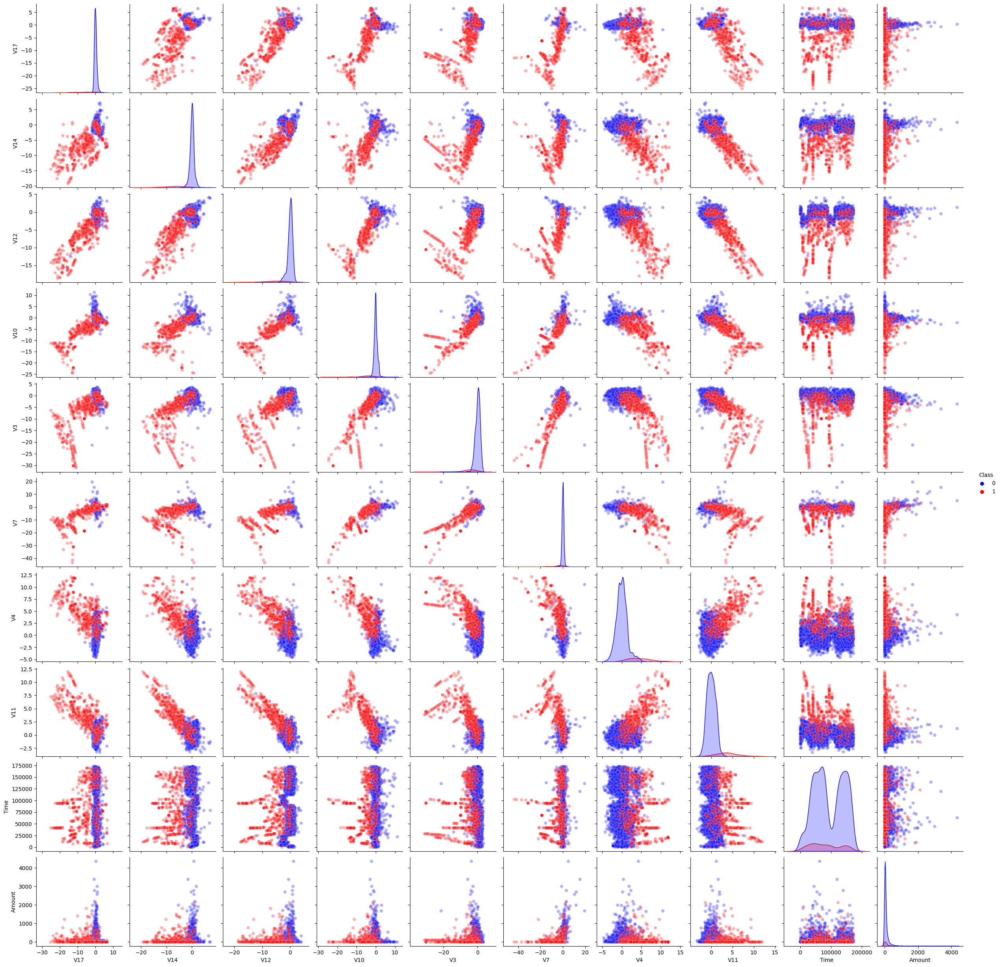

<Figure size 640x480 with 0 Axes>

In [15]:
plt.clf()
Image(filename='images/mvp_pairplot.png')

## Redução de dimensionabilidade

Apesar das variáveis não terem tanta dependencia entre si, pudemos ver pelo heatmap que as variáveis de Tempo e Quantidade possuem alguma correlação com as demais variáveis, então o PCA é importante para reduzirmos a dimensionabilidade do nosso problema e facilitar o aprendizado do método que será escolhido nos próximos passos.

In [16]:
from sklearn.preprocessing import StandardScaler #import the module to perform standardization
from sklearn.decomposition import PCA

signals = data[[c for c in data.columns if c != 'Class']]
responses = data['Class']

pca_obj = PCA(n_components=0.98)
signals_transformed = pca_obj.fit_transform(StandardScaler().fit_transform(signals))

columns = ['C' + str(n) for n in range(1,signals_transformed.shape[1]+1)]
transf_signals_df = pd.DataFrame(signals_transformed, columns=columns) 

transf_input_df = transf_signals_df.copy()
transf_input_df['response'] = responses

print("Com PCA =>", transf_input_df.shape, "Sem PCA =>", data.shape)

Com PCA => (284807, 29) Sem PCA => (284807, 31)


<Axes: >

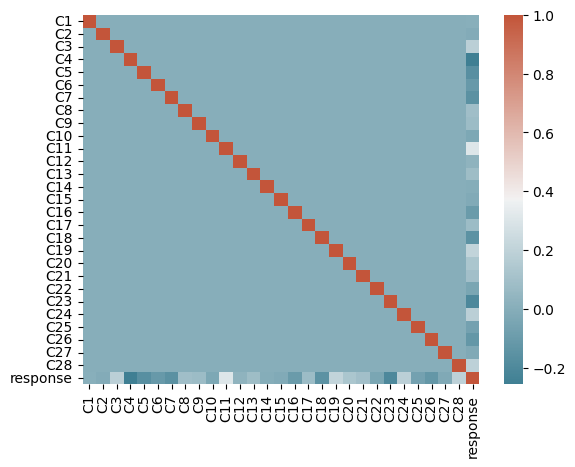

In [17]:
corr = transf_input_df.corr()
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, cmap=sns.diverging_palette(220, 20, as_cmap=True))

Podemos observar que reduzir a dimensionabilidade apenas remove 2 colunas do dataset original, por um lado isso é bom pois as variáveis não possuem mais correlação, porém por outro é mais difícil entender a contribuição de cada variável no modelo preditivo, portanto para este caso iremos prosseguir com as variáveis originais e utilizar o RFE (para esolher as variáveis) com base nas colunas originais.

## Separação do dataset em Treino, Validação e Teste

Treino 80%
Validação 10%
Teste 10%

In [18]:
from sklearn import preprocessing

column_names = data.drop(columns="Class").columns
y = data["Class"].copy(deep=True)

x = data.drop(columns="Class")
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)

data = pd.DataFrame(x_scaled, columns=column_names)
data["Class"] = y.values

nrows = len(data)
total_sample_train = int(len(data) * .8)
total_sample_validation = int(len(data) * .1)
total_sample_test = int(len(data) * .1)

train_df = data.groupby('Class', group_keys=False).apply(lambda x: x.sample(int((x.count()[0]/nrows)*total_sample_train)))
validation_df = data.groupby('Class', group_keys=False).apply(lambda x: x.sample(int((x.count()[0]/nrows)*total_sample_validation)))
test_df = data.groupby('Class', group_keys=False).apply(lambda x: x.sample(int((x.count()[0]/nrows)*total_sample_test)))

## Balanceamento de Classes

Um dataset de dados de fraude tende a ser altamente desbalanceado, pela maioria das transações serem de boa fé, mas para um modelo aprender o que é uma transação fraudulenta precisa-se de um dataset balanceado, ou seja, com um número de ocorrencias similar entre fraude e não fraude.

In [19]:
train_df.groupby("Class")[["Time"]].count()

,Time
Class,
0,227451
1,393


Aqui foi escolhido um método de undersampling para balancear os dados, nesse método um número N de clusteres (nesse caso 9) é encontrado na classe com mais dados, e um randomicamente são escolhidos X ocorrencias de dados de cada cluster.

In [20]:
from sklearn.cluster import KMeans
import math

non_fraud_transactions_df = train_df[train_df["Class"] == 0]
non_fraud_transactions_features = train_df.copy(deep=True)
non_fraud_transactions_features.drop(columns="Class")

non_fraud_transactions_features["cluster"] = KMeans(n_clusters=9, random_state=0, n_init="auto").fit_predict(non_fraud_transactions_features)

In [21]:
sample_per_cluster = 200
undersampled_normal_transactions_df = non_fraud_transactions_features.groupby('cluster').apply(lambda x: x.sample(sample_per_cluster)).drop(columns="cluster")
under_train_df = pd.concat([undersampled_normal_transactions_df, train_df[train_df["Class"] == 1]]).copy(deep=True)

In [22]:
under_train_df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
"(0, 25521)",0.194731,0.957116,0.747229,0.821046,0.314754,0.764661,0.269517,0.271515,0.784482,0.456125,...,0.567838,0.500678,0.653115,0.277486,0.612720,0.379246,0.414617,0.315313,0.026095,0
"(0, 73518)",0.319280,0.966405,0.743966,0.850750,0.242640,0.751292,0.261408,0.260929,0.786101,0.451679,...,0.571525,0.549082,0.658631,0.461995,0.590321,0.405924,0.415806,0.314953,0.016951,0
"(0, 73726)",0.319772,0.930316,0.748361,0.876605,0.159013,0.756134,0.258650,0.263753,0.787223,0.390744,...,0.563489,0.515402,0.674856,0.425531,0.593131,0.378978,0.420585,0.316580,0.010613,0
"(0, 37426)",0.225421,0.977461,0.766820,0.862008,0.315081,0.757853,0.258992,0.261895,0.786268,0.494014,...,0.560782,0.513176,0.665998,0.476922,0.598249,0.355514,0.417826,0.313958,0.000389,0
"(0, 28017)",0.201468,0.911450,0.750725,0.865358,0.205447,0.752511,0.265318,0.271342,0.781095,0.461438,...,0.556469,0.519272,0.658157,0.450880,0.603769,0.371648,0.417807,0.325078,0.017817,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42856,0.238859,0.759827,0.834080,0.606994,0.592856,0.692406,0.234945,0.188828,0.863553,0.201996,...,0.595872,0.450715,0.664909,0.465112,0.597498,0.355385,0.403684,0.296504,0.006737,1
203700,0.780869,0.978764,0.801425,0.733263,0.505531,0.776140,0.239684,0.260592,0.786207,0.360253,...,0.563065,0.470571,0.664970,0.438983,0.599706,0.434602,0.425589,0.320041,0.000000,1
143728,0.495237,0.928449,0.801726,0.765441,0.425901,0.753910,0.252908,0.239079,0.802127,0.349250,...,0.576172,0.512506,0.659973,0.277623,0.594303,0.429695,0.436131,0.323294,0.000039,1
106679,0.405522,0.950817,0.779258,0.781493,0.395658,0.752023,0.246748,0.246909,0.793587,0.400706,...,0.573798,0.497175,0.660331,0.413642,0.611947,0.373923,0.430692,0.322451,0.008847,1


## Escolha de variáveis

Aqui o RFE será utilizado (por questões de tempo) para escolher quais variáveis utilizar no nosso modelo de classificação, ele utiliza um modelo simples e escolhe as variáveis que melhor melhoram alguma métrica deste modelo, aqui iremos utilizar a configuração padrão por restrições de tempo.

In [23]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import recall_score, accuracy_score, precision_score, f1_score
from tqdm import tqdm

X = under_train_df.drop(columns='Class')
y = under_train_df['Class']

max_recall = 0
used_params = []

params = []

for i in tqdm(range(1,20)):
    estimator = DecisionTreeClassifier(max_depth=5)
    selector = RFE(estimator, n_features_to_select=i, step=1)
    selector = selector.fit(X, y)

    best_features_X = X[selector.get_feature_names_out()]

    estimator.fit(best_features_X, y)
    y_pred = estimator.predict(best_features_X)

    _recall = recall_score(y, y_pred)
    precision = precision_score(y, y_pred)
    _acc = accuracy_score(y, y_pred)

    params.append({"n_features": i, "recall": _recall, "accuracy": _acc, "precision": precision})
    if _recall >= max_recall:
        max_recall = _recall
        used_params = selector.get_feature_names_out()

100%|██████████| 19/19 [00:07<00:00,  2.67it/s]


In [24]:
pd.DataFrame(params)

,n_features,recall,accuracy,precision
0,1,0.845570,0.970816,0.991098
1,2,0.875949,0.977656,1.000000
2,3,0.873418,0.977200,1.000000
3,4,0.883544,0.978568,0.997143
4,5,0.901266,0.978568,0.978022
5,6,0.906329,0.978112,0.970190
6,7,0.901266,0.978568,0.978022
7,8,0.906329,0.978112,0.970190
8,9,0.906329,0.978112,0.970190
9,10,0.906329,0.978112,0.970190


In [25]:
estimator = DecisionTreeClassifier(max_depth=5)
selector = RFE(estimator, n_features_to_select=7, step=1)
selector = selector.fit(X, y)

In [26]:
under_train_df = under_train_df[[*selector.get_feature_names_out(), "Class"]]
under_train_df

,Time,V7,V9,V14,V17,V20,V23,Class
"(0, 25521)",0.194731,0.271515,0.456125,0.664208,0.720218,0.593169,0.653115,0
"(0, 73518)",0.319280,0.260929,0.451679,0.636632,0.736520,0.589879,0.658631,0
"(0, 73726)",0.319772,0.263753,0.390744,0.624026,0.745499,0.586300,0.674856,0
"(0, 37426)",0.225421,0.261895,0.494014,0.636285,0.727801,0.578565,0.665998,0
"(0, 28017)",0.201468,0.271342,0.461438,0.599217,0.740327,0.572093,0.658157,0
...,...,...,...,...,...,...,...,...
42856,0.238859,0.188828,0.201996,0.294059,0.074207,0.569519,0.664909,1
203700,0.780869,0.260592,0.360253,0.292453,0.744581,0.583866,0.664970,1
143728,0.495237,0.239079,0.349250,0.356740,0.459778,0.589579,0.659973,1
106679,0.405522,0.246909,0.400706,0.420309,0.532857,0.589804,0.660331,1


## Treinando os Modelos

Aqui o objetivo é treinar o modelo para uma análise inicial de qual caminho seguir com futuras pesquisas, 4 modelos foram selecionados para esta primeira etapa:

Regressão Logistica

Floresta Randômica

Gradient Boosting

KNN

In [145]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier

logistic_regression = LogisticRegression()
logistic_regression_boost = LogisticRegression(penalty="l1", solver="saga", tol=1e-5)
random_forest = RandomForestClassifier(n_estimators=50)
gradient_boosting = GradientBoostingClassifier(max_depth=5)
knn = KNeighborsClassifier(n_neighbors=5)

models = {
    "logistic_regression": logistic_regression,
    "logistic_regression_boost": logistic_regression_boost,
    "random_forest": random_forest,
    "gradient_boosting": gradient_boosting,
    "knn": knn
}

In [146]:
X = under_train_df.drop(columns="Class")
y = under_train_df["Class"]

for key in models:
    models[key].fit(X, y)

In [147]:
def test_multiple_models(data):
    train_results = []

    X = data.drop(columns="Class")
    y = data["Class"]

    for key in models:
        y_pred = models[key].predict(X)

        _acc = accuracy_score(y, y_pred)
        precision = precision_score(y, y_pred)
        recall = recall_score(y, y_pred)
        f1 = f1_score(y, y_pred)
        
        train_results.append({"model": key, "precision": precision, "recall": recall, "f1": f1, "accuracy": _acc})

    return pd.DataFrame(train_results)

def draw_confusion_matrix(model, data):
    
    X = data.drop(columns="Class")
    y = data["Class"]

    y_pred = model.predict(X)
    confusion_matrix = pd.crosstab(y, y_pred, rownames=['Actual'], colnames=['Predicted'])

    sns.heatmap(confusion_matrix, annot=True, cmap="crest")
    plt.show()


### Treino

In [148]:
test_multiple_models(under_train_df)

,model,precision,recall,f1,accuracy
0,logistic_regression,1.000000,0.756962,0.861671,0.956224
1,logistic_regression_boost,1.000000,0.756962,0.861671,0.956224
2,random_forest,1.000000,1.000000,1.000000,1.000000
3,gradient_boosting,1.000000,1.000000,1.000000,1.000000
4,knn,0.988406,0.863291,0.921622,0.973552


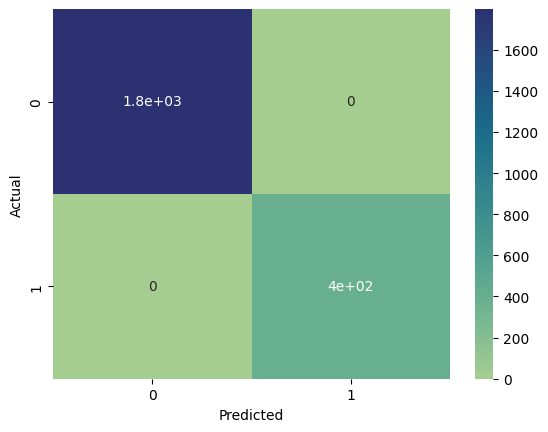

In [149]:
draw_confusion_matrix(models["random_forest"], under_train_df[[*selector.get_feature_names_out(), "Class"]])

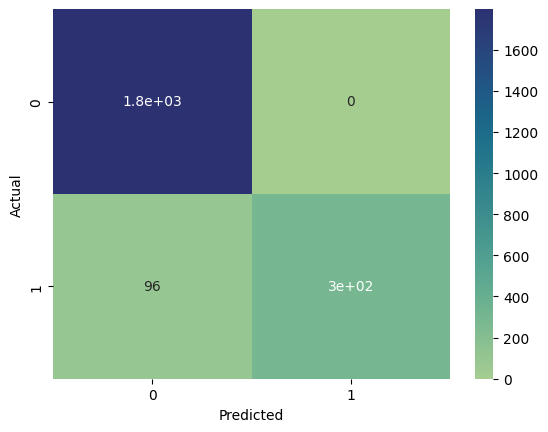

In [150]:
draw_confusion_matrix(models["logistic_regression"], under_train_df[[*selector.get_feature_names_out(), "Class"]])

## Validação

In [151]:
test_multiple_models(validation_df[[*selector.get_feature_names_out(), "Class"]])

,model,precision,recall,f1,accuracy
0,logistic_regression,0.795918,0.795918,0.795918,0.999298
1,logistic_regression_boost,0.795918,0.795918,0.795918,0.999298
2,random_forest,0.382114,0.959184,0.546512,0.997261
3,gradient_boosting,0.150000,0.979592,0.260163,0.990414
4,knn,0.412844,0.918367,0.569620,0.997612


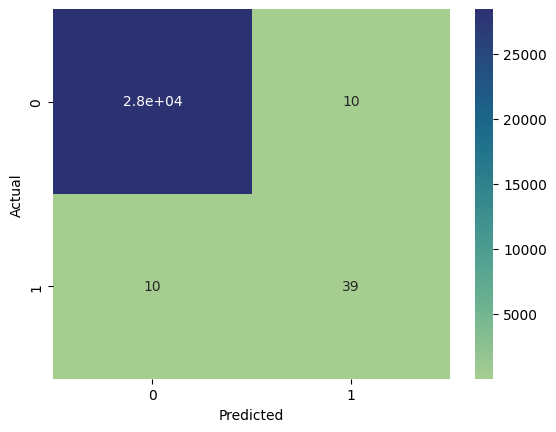

In [141]:
draw_confusion_matrix(models["logistic_regression"], validation_df[[*selector.get_feature_names_out(), "Class"]])

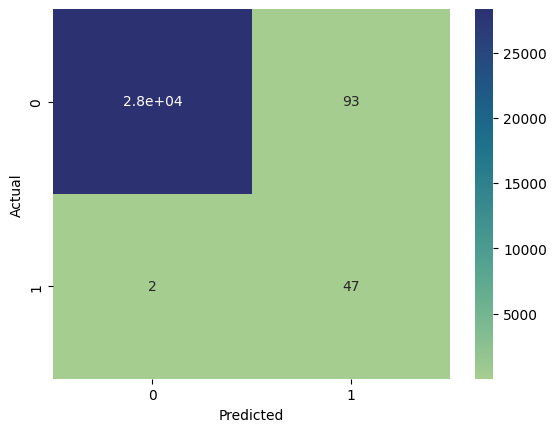

In [142]:
draw_confusion_matrix(models["random_forest"], validation_df[[*selector.get_feature_names_out(), "Class"]])

Pode-se observar que o algoritmo de Random Forest desempenhou melhor em detectar com sucesso os casos de fraude, porém ele acusa erroneamente muitos outros casos de fraude, que na verdade são transações normais, por outro lado a regressão logistica não é tão boa quanto em detectar os casos de fraude, porém sempre que o faz existe uma certeza maior que a fraude é real, pois ele também tem uma precisão considerável.

## Tuning do modelo

Para o tunning o modelo escolhido será o de Regressão logistica

In [143]:
param_grid = [
  {'penalty': ['l1', 'l2', 'elasticnet', None], 'solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'], 'intercept_scaling': [0, 1, 2], 'C': [0.3, 0.5,1], 'tol': [1e-5, 1e-4, 1e-3]},
 ]

In [144]:
from sklearn.model_selection import GridSearchCV
import warnings

warnings.filterwarnings('ignore')

clf = GridSearchCV(LogisticRegression(), param_grid, scoring="f1")

df = under_train_df[[*selector.get_feature_names_out(), "Class"]]

X = df.drop(columns="Class")
y = df["Class"]


clf.fit(X, y)
clf.best_params_

{'C': 1,
 'intercept_scaling': 1,
 'penalty': 'l1',
 'solver': 'saga',
 'tol': 1e-05}

Pode-se observar que este tuning acabar dando overfiting, não sendo melhor que os parâmetros convencionais.